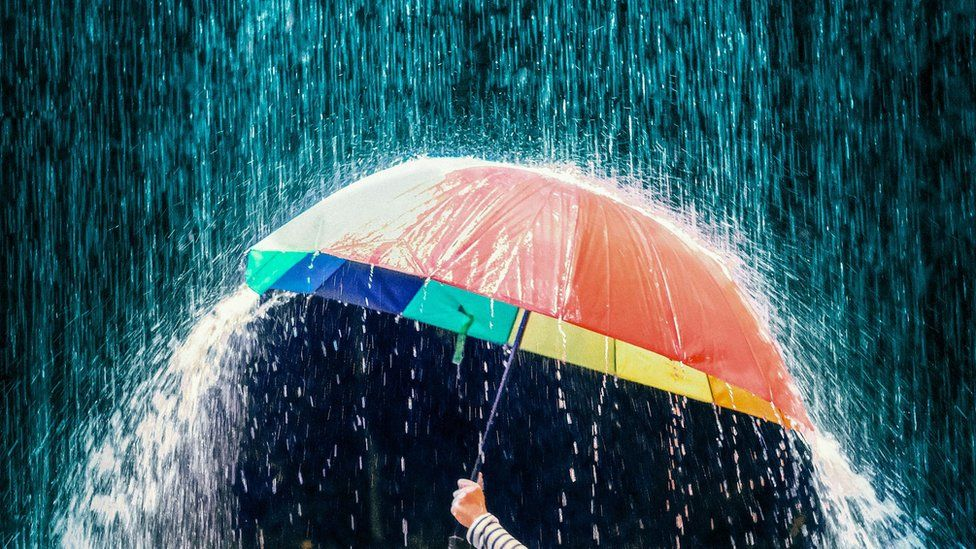


<b><font color='blue' size=5>Step 1 | Import Libraries<font/><b/>
    



In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
from datasist.structdata import detect_outliers
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
from sklearn.preprocessing  import LabelEncoder,OrdinalEncoder,MinMaxScaler,StandardScaler,RobustScaler,OneHotEncoder
from sklearn.model_selection import cross_validate,train_test_split,GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.feature_selection import SequentialFeatureSelector
import joblib as jb

<b><font color='blue' size=5>Step 2 | Read Dataset<font/><b/>


In [2]:
df=pd.read_csv('weatherAUS.csv')

In [3]:
df.shape

(142193, 24)

In [4]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


<div style="background-color: cyan;">
<i><font color='brown'>Date: Date of the weather data.<br>
Location: The location for which the weather data is recorded.<br>
MinTemp: Minimum temperature for the day.<br>
MaxTemp: Maximum temperature for the day.<br>
Rainfall: Amount of rainfall for the day.<br>
Evaporation: Evaporation data.<br>
Sunshine: Sunshine duration in hours.<br>
WindGustDir: Direction of the wind gust.<br>
WindGustSpeed: Speed of the wind gust.<br>
WindDir9am: Wind direction at 9 AM.<br>
WindDir3pm: Wind direction at 3 PM.<br>
WindSpeed9am: Wind speed at 9 AM.<br>
WindSpeed3pm: Wind speed at 3 PM.<br>
Humidity9am: Humidity at 9 AM.<br>
Humidity3pm: Humidity at 3 PM.<br>
Pressure9am: Atmospheric pressure at 9 AM.<br>
Pressure3pm: Atmospheric pressure at 3 PM.<br>
Cloud9am: Cloud cover at 9 AM.<br>
Cloud3pm: Cloud cover at 3 PM.<br>
Temp9am: Temperature at 9 AM.<br>
Temp3pm: Temperature at 3 PM.<br>
RainToday: Whether it rained today (yes/no).<br>
RISK_MM: A numerical risk value related to rainfall.<br>
RainTomorrow: The target variable indicating whether it will rain tomorrow (yes/no).<br></font></i>

<b><font color='blue' size=5>Step 3 | Dataset Overview<font/><b/>


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

In [52]:
df.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          679
Evaporation       356
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           440
Temp3pm           500
RainToday           2
RISK_MM           681
RainTomorrow        2
dtype: int64

In [53]:
df.isnull().mean()*100

Date              0.000000
Location          0.000000
MinTemp           0.447983
MaxTemp           0.226453
Rainfall          0.988797
Evaporation      42.789026
Sunshine         47.692924
WindGustDir       6.561504
WindGustSpeed     6.519308
WindDir9am        7.041838
WindDir3pm        2.656952
WindSpeed9am      0.948007
WindSpeed3pm      1.849599
Humidity9am       1.247600
Humidity3pm       2.538803
Pressure9am       9.855619
Pressure3pm       9.832411
Cloud9am         37.735332
Cloud3pm         40.152469
Temp9am           0.635756
Temp3pm           1.917113
RainToday         0.988797
RISK_MM           0.000000
RainTomorrow      0.000000
dtype: float64

In [54]:
df.duplicated().sum()

0

In [55]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
count,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000,142193.000000
mean,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235,2.360682
std,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594,8.477969
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000


In [56]:
df.describe(include='O')

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,142193,142193,132863,132180,138415,140787,142193
unique,3436,49,16,16,16,2,2
top,2013-12-01,Canberra,W,N,SE,No,No
freq,49,3418,9780,11393,10663,109332,110316


<div style="background-color: cyan;">Inferences:<br>
Number of Entries: The dataset consists of  142193 entries, ranging from index 0 to 142192  <br>
Columns: There are 24 columns in the dataset.<br>
Data Types:Most of the columns are of the float64 data type.(17) and 8 object<br>
Missing Values: There is missing values in the dataset. </div>


<b><font color='blue' size=5>Step 4 | Data visualization(1- univariant)<font/><b/>


In [57]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RISK_MM', 'RainTomorrow'],
      dtype='object')

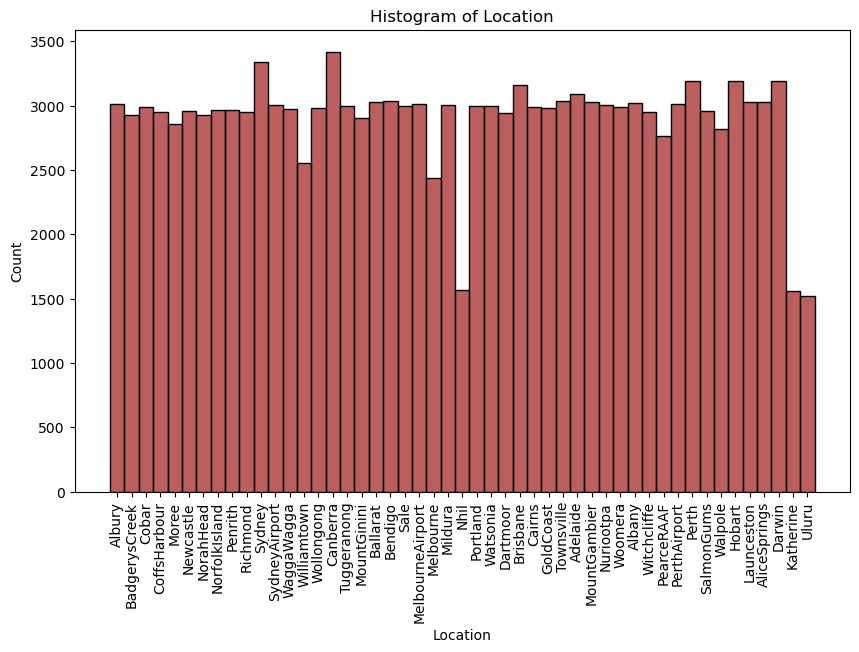

In [58]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(df,x='Location',color='brown',ax=ax)
plt.title('Histogram of Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [59]:
df['Location'].unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

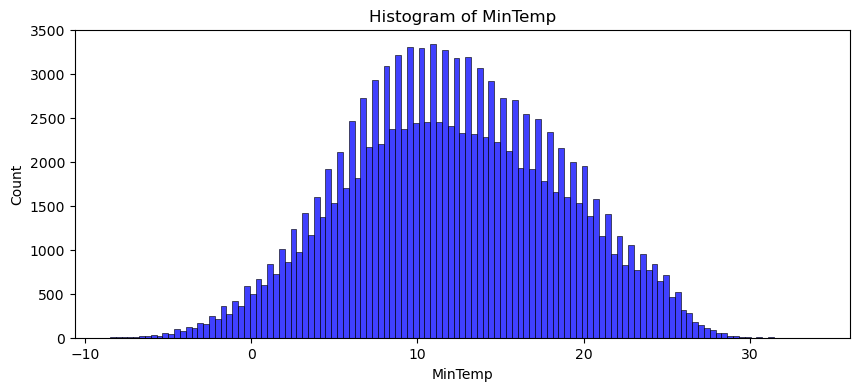

In [60]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='MinTemp',color='blue',ax=ax)
plt.title('Histogram of MinTemp')
plt.xlabel('MinTemp')
plt.ylabel('Count')
plt.show()

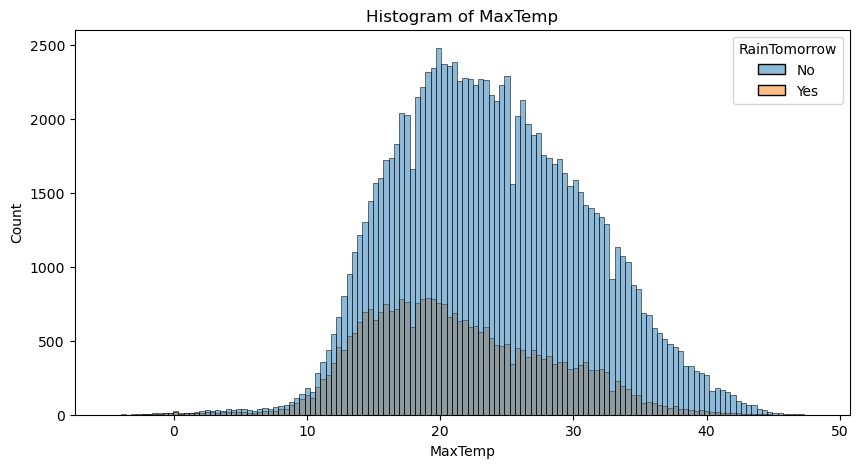

In [61]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(df,x='MaxTemp',color='dark',hue='RainTomorrow',ax=ax)
plt.title('Histogram of MaxTemp')
plt.xlabel('MaxTemp')
plt.ylabel('Count')
plt.show()

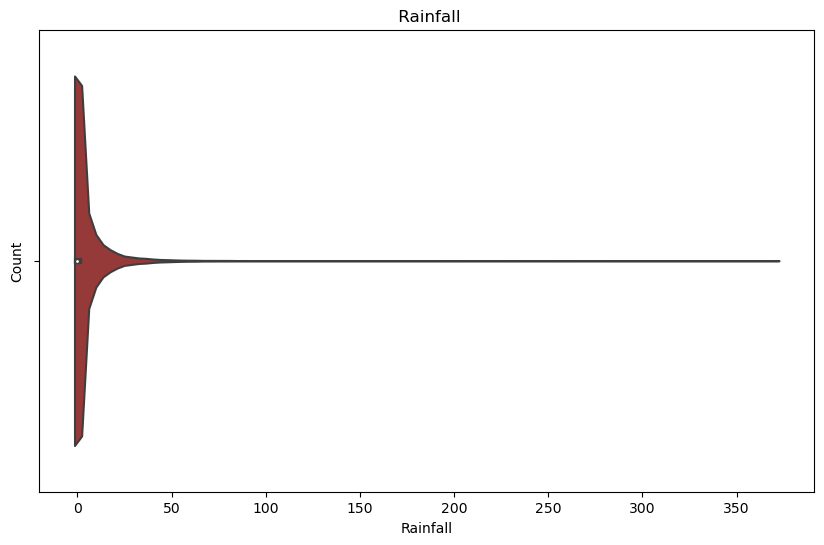

In [62]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(df,x='Rainfall',color='brown')
plt.title(' Rainfall')
plt.xlabel('Rainfall')
plt.ylabel('Count')
plt.show()

In [63]:
df['Rainfall'].value_counts()

Rainfall
0.0      90275
0.2       8685
0.4       3750
0.6       2562
0.8       2028
         ...  
134.8        1
84.4         1
157.6        1
166.8        1
69.0         1
Name: count, Length: 679, dtype: int64

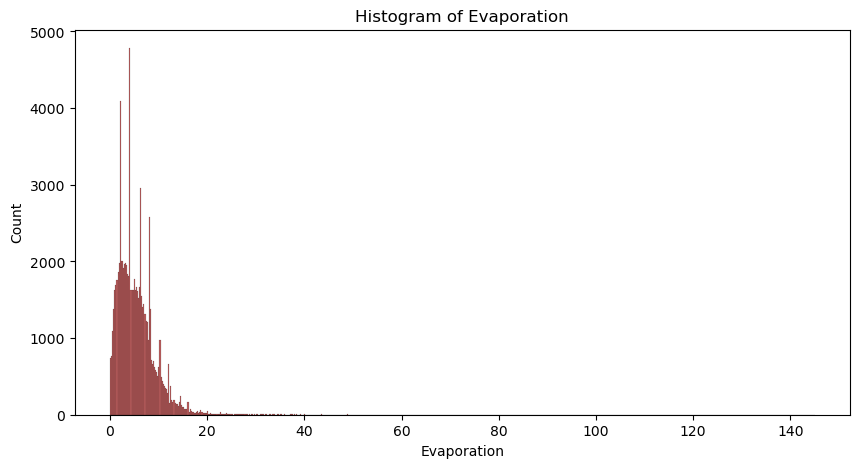

In [64]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(df,x='Evaporation',color='brown',ax=ax)
plt.title('Histogram of Evaporation')
plt.xlabel('Evaporation')
plt.ylabel('Count')
plt.show()

In [65]:
df['Evaporation'].value_counts()

Evaporation
4.0     3282
8.0     2574
2.2     2057
2.0     1996
2.6     1975
        ... 
17.1       1
19.7       1
20.5       1
18.1       1
39.6       1
Name: count, Length: 356, dtype: int64

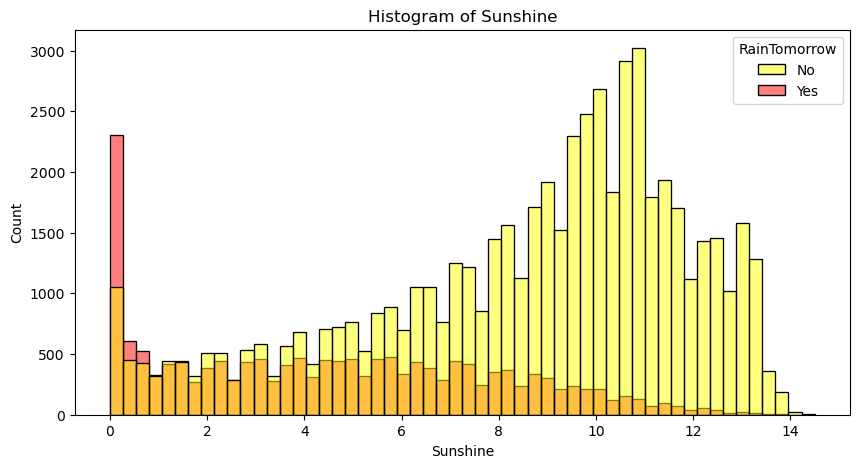

In [66]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(df,x='Sunshine',hue='RainTomorrow',color='green',palette={'No':'yellow','Yes':'red'})
plt.title('Histogram of Sunshine')
plt.xlabel('Sunshine')
plt.ylabel('Count')
plt.show()

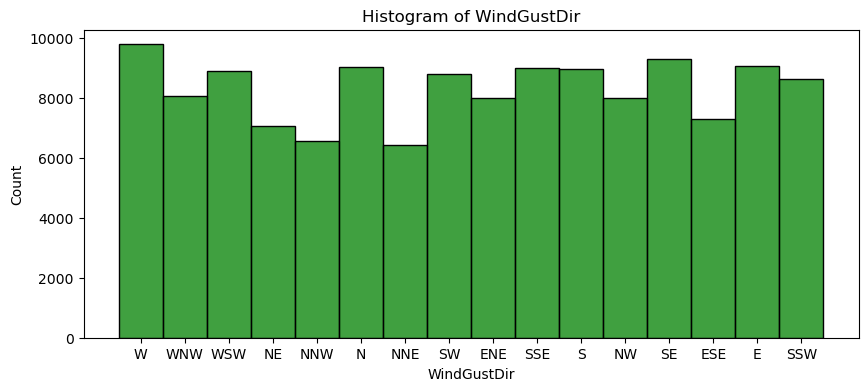

In [67]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='WindGustDir',color='green')
plt.title('Histogram of WindGustDir')
plt.xlabel('WindGustDir')
plt.ylabel('Count')
plt.show()

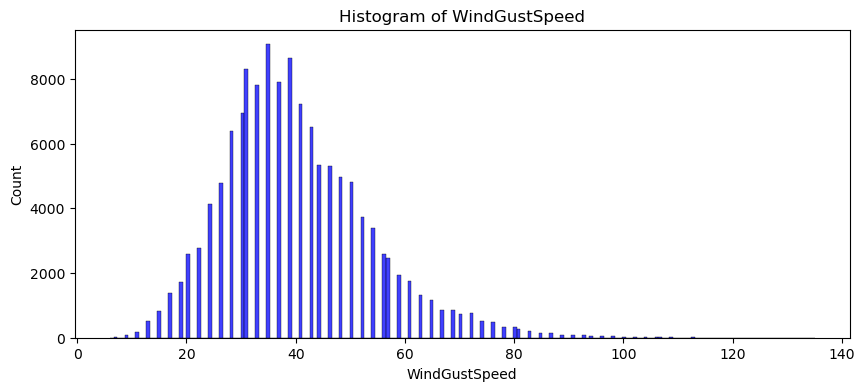

In [68]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='WindGustSpeed',color='blue')
plt.title('Histogram of WindGustSpeed')
plt.xlabel('WindGustSpeed')
plt.ylabel('Count')
plt.show()

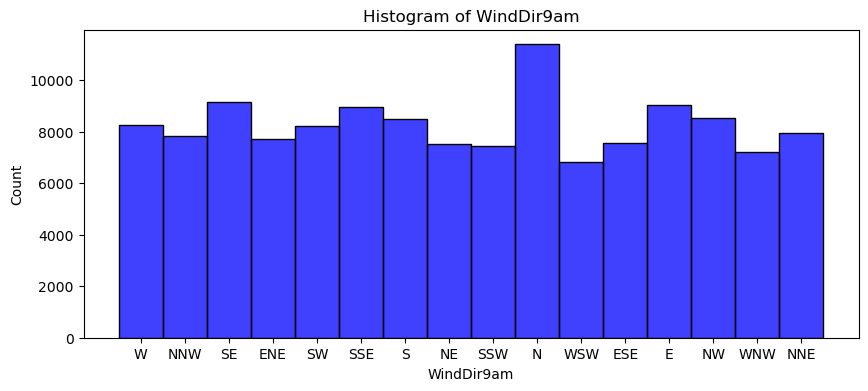

In [69]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='WindDir9am',color='blue')
plt.title('Histogram of WindDir9am')
plt.xlabel('WindDir9am')
plt.ylabel('Count')
plt.show()

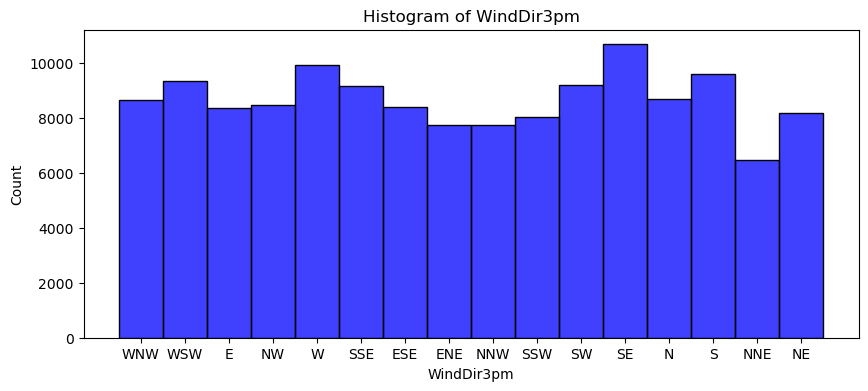

In [70]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='WindDir3pm',color='blue')
plt.title('Histogram of WindDir3pm')
plt.xlabel('WindDir3pm')
plt.ylabel('Count')
plt.show()

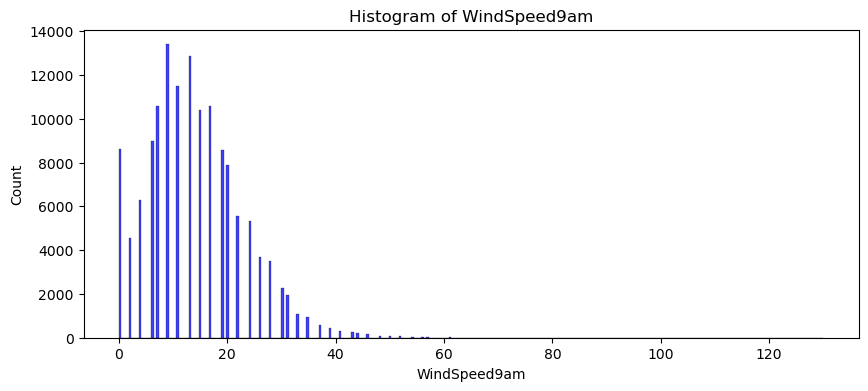

In [71]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='WindSpeed9am',color='blue')
plt.title('Histogram of WindSpeed9am')
plt.xlabel('WindSpeed9am')
plt.ylabel('Count')
plt.show()

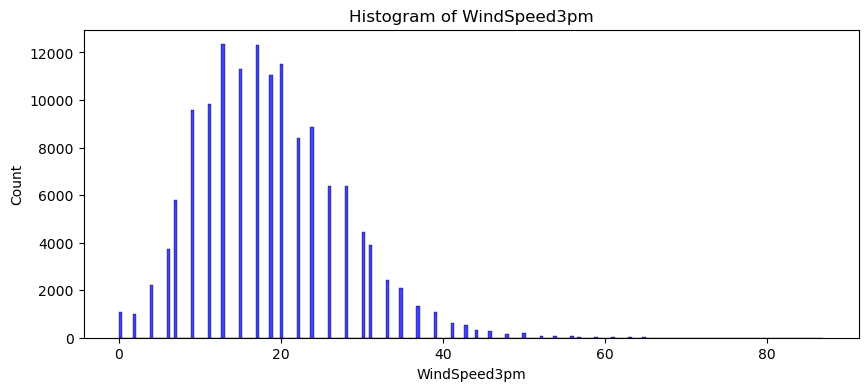

In [72]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='WindSpeed3pm',color='blue')
plt.title('Histogram of WindSpeed3pm')
plt.xlabel('WindSpeed3pm')
plt.ylabel('Count')
plt.show()

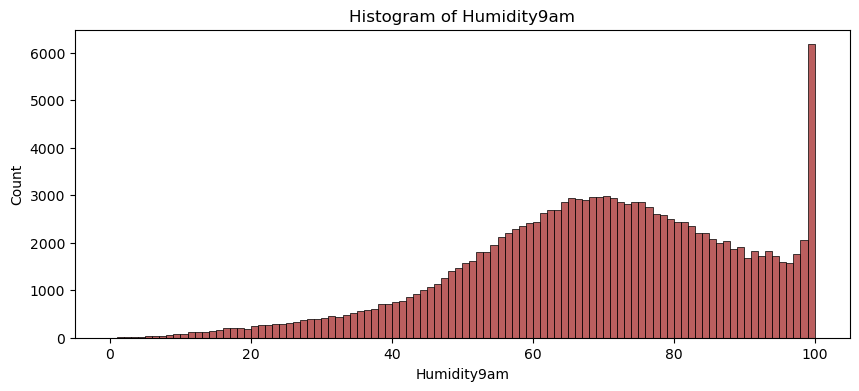

In [73]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='Humidity9am',color='brown')
plt.title('Histogram of Humidity9am')
plt.xlabel('Humidity9am')
plt.ylabel('Count')
plt.show()

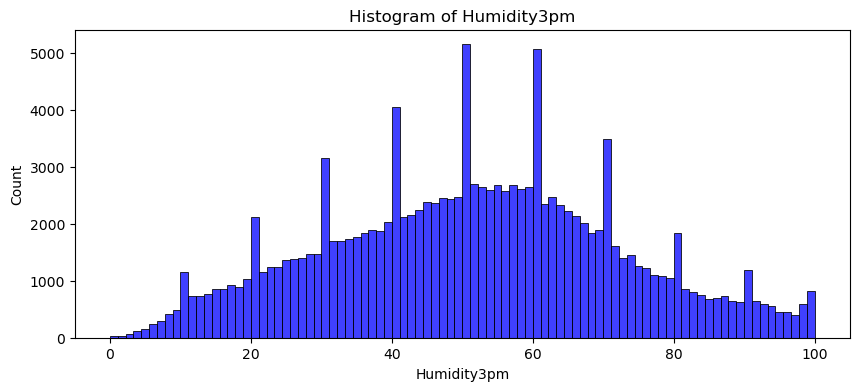

In [74]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.histplot(df,x='Humidity3pm',color='blue')
plt.title('Histogram of Humidity3pm')
plt.xlabel('Humidity3pm')
plt.ylabel('Count')
plt.show()

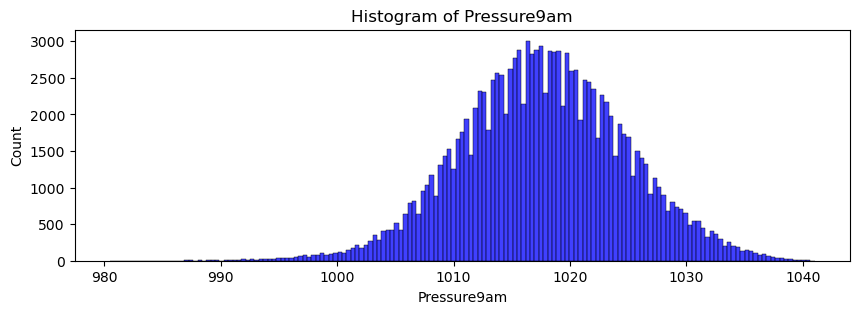

In [75]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='Pressure9am',color='blue')
plt.title('Histogram of Pressure9am')
plt.xlabel('Pressure9am')
plt.ylabel('Count')
plt.show()

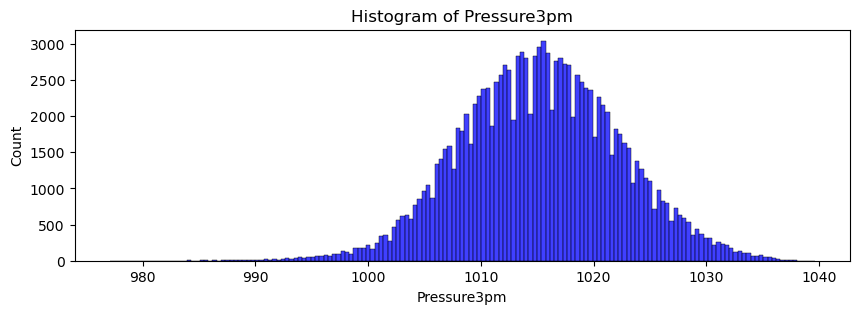

In [76]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='Pressure3pm',color='blue')
plt.title('Histogram of Pressure3pm')
plt.xlabel('Pressure3pm')
plt.ylabel('Count')
plt.show()

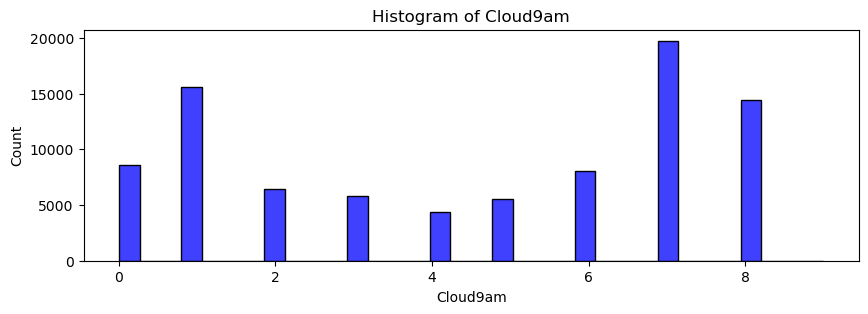

In [77]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='Cloud9am',color='blue',ax=ax)
plt.title('Histogram of Cloud9am')
plt.xlabel('Cloud9am')
plt.ylabel('Count')
plt.show()

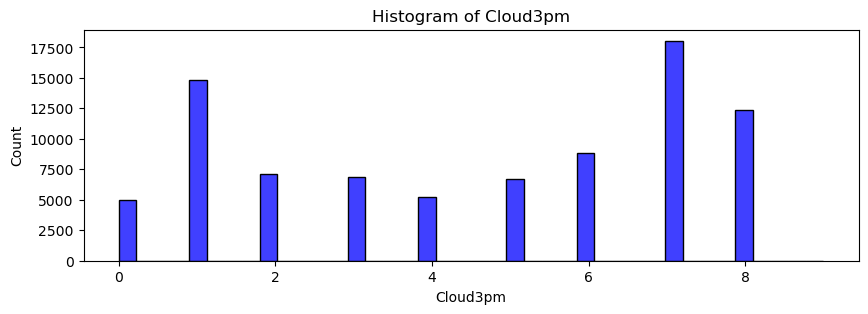

In [78]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='Cloud3pm',color='blue',ax=ax)
plt.title('Histogram of Cloud3pm')
plt.xlabel('Cloud3pm')
plt.ylabel('Count')
plt.show()

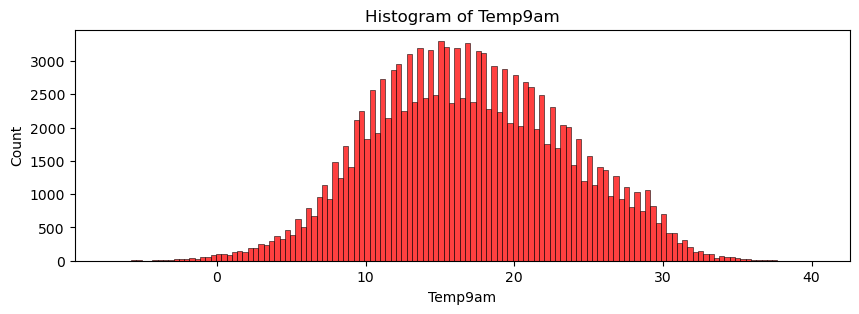

In [79]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='Temp9am',color='red',ax=ax)
plt.title('Histogram of Temp9am')
plt.xlabel('Temp9am')
plt.ylabel('Count')
plt.show()

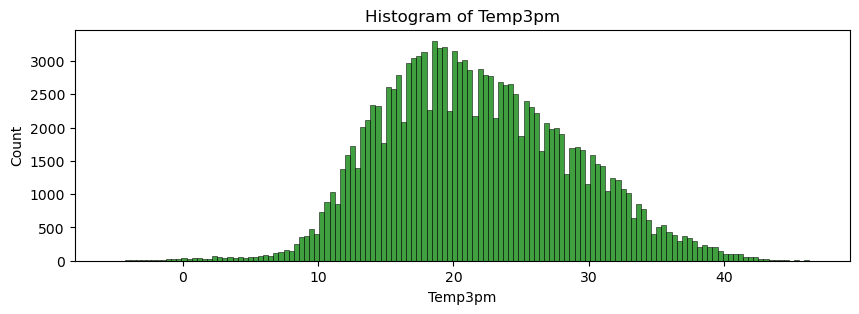

In [80]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='Temp3pm',color='green',ax=ax)
plt.title('Histogram of Temp3pm')
plt.xlabel('Temp3pm')
plt.ylabel('Count')
plt.show()

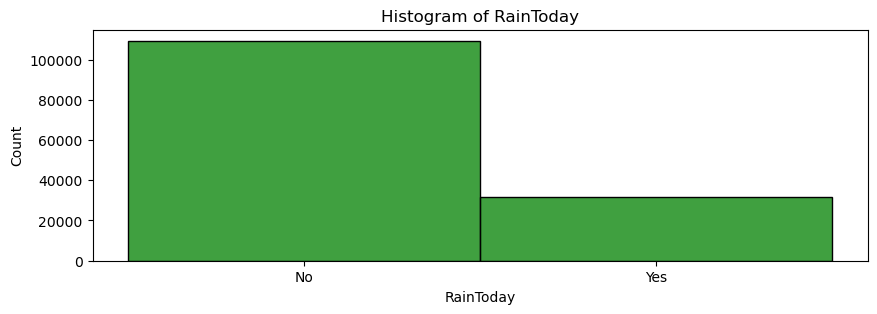

In [81]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='RainToday',color='green',ax=ax)
plt.title('Histogram of RainToday')
plt.xlabel('RainToday')
plt.ylabel('Count')
plt.show()

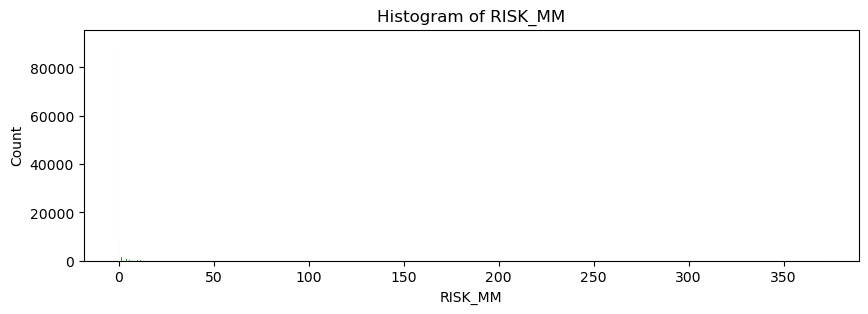

In [5]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='RISK_MM',color='green',ax=ax)
plt.title('Histogram of RISK_MM')
plt.xlabel('RISK_MM')
plt.ylabel('Count')
plt.show()

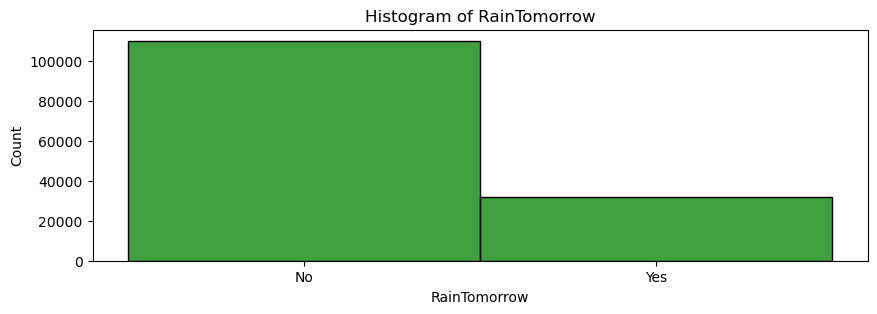

In [83]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.histplot(df,x='RainTomorrow',color='green',ax=ax)
plt.title('Histogram of RainTomorrow')
plt.xlabel('RainTomorrow')
plt.ylabel('Count')
plt.show()

### bivariant

##### what's the volume of rainfall in every city?

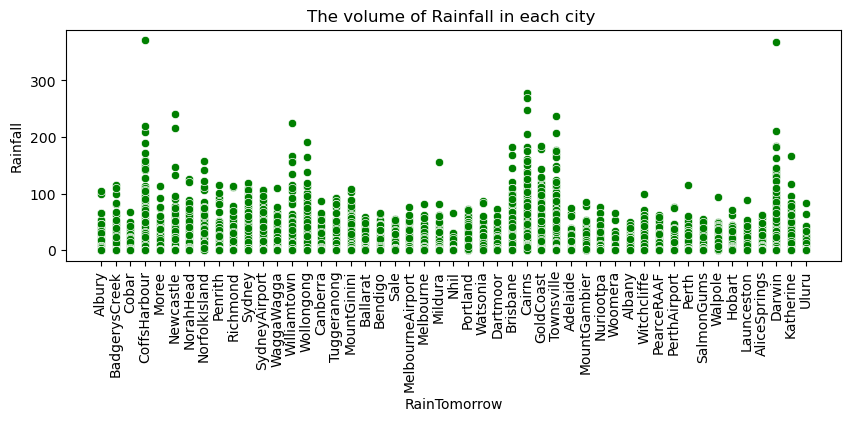

In [84]:
fig, ax = plt.subplots(figsize=(10, 3))
sns.scatterplot(df,x='Location',y='Rainfall',color='green',ax=ax)
plt.title('The volume of Rainfall in each city ')
plt.xlabel('RainTomorrow')
plt.ylabel('Rainfall')
plt.xticks(rotation=90)

plt.show()

In [6]:
df['Date']=pd.to_datetime(df['Date'])

In [7]:
df['Year']=df['Date'].dt.year
df['month']=df['Date'].dt.month
df['day']=df['Date'].dt.day

In [8]:
df['Year'].value_counts()

Year
2016    17508
2014    17400
2015    17231
2009    16595
2010    16419
2013    16097
2011    15126
2012    15044
2017     8466
2008     2246
2007       61
Name: count, dtype: int64

In [9]:
del df['Date']

##### what's the total of  amount rainfall in every Year?

<Axes: title={'center': 'Rainfall over years'}, xlabel='Year'>

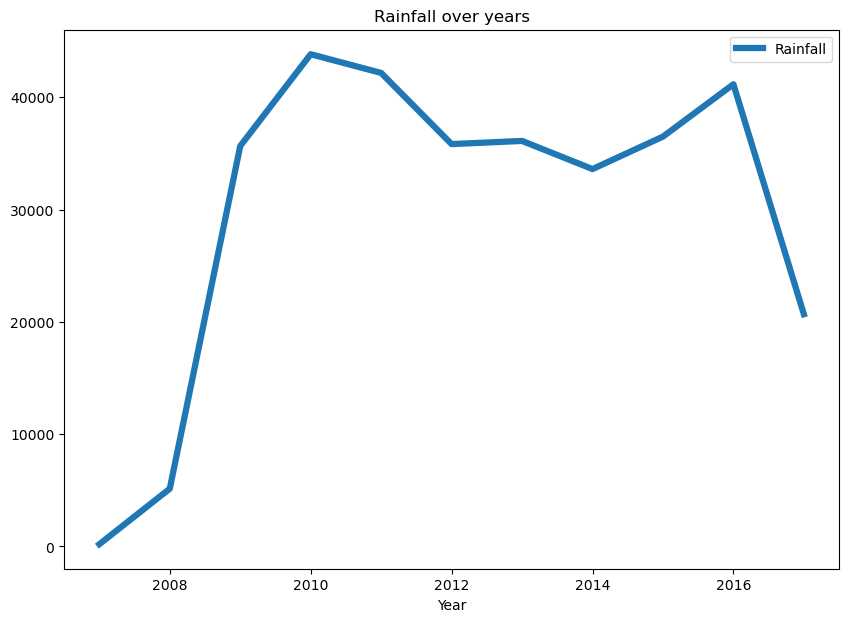

In [89]:
RF=pd.pivot_table(df,index='Year',values='Rainfall',aggfunc='sum')
RF.plot(kind='line',figsize=(10,7),linewidth=4.5,title='Rainfall over years')

<div style="background-color: cyan;">We note the highest amount of water in 2010 </div>

##### what's the total of  amount rainfall in every month?

<Axes: title={'center': 'Rainfall over month'}, xlabel='month'>

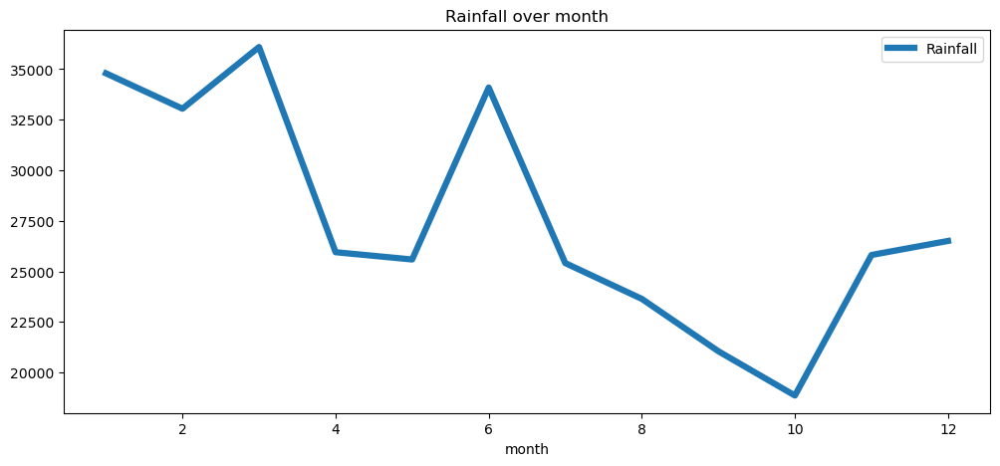

In [90]:
RF=pd.pivot_table(df,index='month',values='Rainfall',aggfunc='sum')
RF.plot(kind='line',figsize=(12,5),linewidth=4.5,title='Rainfall over month')

<div style="background-color: cyan;">We note the highest amount of water in March </div>

### Web Scrap long and lat 

In [166]:
cities=df['Location'].unique().tolist()

In [169]:
#Nominatim geocoder
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent="city_coordinates",)

coordinates = {}

for city in cities:
    location = geolocator.geocode(city,country_codes='AU')
    if location:
        coordinates[city] = (location.latitude, location.longitude)


In [170]:
coordinates_df = pd.DataFrame(coordinates.values(), index=coordinates.keys(), columns=['Latitude', 'Longitude'])
coordinates_df['Location'] = coordinates_df.index
data = pd.merge(df, coordinates_df[['Location', 'Latitude', 'Longitude']], on='Location', how='left')


In [171]:


fig = px.scatter_geo(data, lat='Latitude', lon='Longitude', color='RainTomorrow', size_max=5, title='Geographic Distribution of Rain Tomorrow')

fig.show()


### Fill Missing _value

In [10]:
df['MinTemp']=df['MinTemp'].fillna(df['MinTemp'].mean())

In [11]:
df['MaxTemp']=df['MaxTemp'].fillna(df['MaxTemp'].mean())

In [12]:
df['Rainfall']=df['Rainfall'].fillna(df['Rainfall'].median())

In [13]:
df['Evaporation']=df['Evaporation'].fillna(df['Evaporation'].median())

In [14]:
df['Sunshine']=df['Sunshine'].fillna(df['Sunshine'].median())

In [15]:
df['WindGustDir']=df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])

In [16]:
df['WindGustSpeed']=df['WindGustSpeed'].fillna(df['WindGustSpeed'].median())

In [17]:
df['WindDir9am']=df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])

In [18]:
df['WindDir3pm']=df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])

In [19]:
df['WindSpeed9am']=df['WindSpeed9am'].fillna(df['WindSpeed9am'].median())

In [20]:
df['WindSpeed3pm']=df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].median())

In [21]:
df['Humidity9am']=df['Humidity9am'].fillna(df['Humidity9am'].median())

In [22]:
df['Humidity3pm']=df['Humidity3pm'].fillna(df['Humidity3pm'].median())

In [23]:
df['Pressure9am']=df['Pressure9am'].fillna(df['Pressure9am'].median())

In [24]:
df['Pressure3pm']=df['Pressure3pm'].fillna(df['Pressure3pm'].median())

In [25]:
df['Cloud9am']=df['Cloud9am'].fillna(df['Cloud9am'].mode()[0])

In [26]:
df['Cloud3pm']=df['Cloud3pm'].fillna(df['Cloud3pm'].mode()[0])

In [27]:
df['Temp9am']=df['Temp9am'].fillna(df['Temp9am'].median())

In [28]:
df['Temp3pm']=df['Temp3pm'].fillna(df['Temp3pm'].median())

In [29]:
df['RainToday']=df['RainToday'].fillna(df['RainToday'].mode()[0])

In [119]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RISK_MM          0
RainTomorrow     0
Year             0
month            0
day              0
dtype: int64

In [120]:
categrical_data=df.select_dtypes(exclude=np.number).columns.tolist()

In [121]:
categrical_data

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [122]:
numerical_data=df.select_dtypes(include=np.number).columns.tolist()

In [123]:
numerical_data

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RISK_MM',
 'Year',
 'month',
 'day']

In [124]:
corr=df[numerical_data].corr()

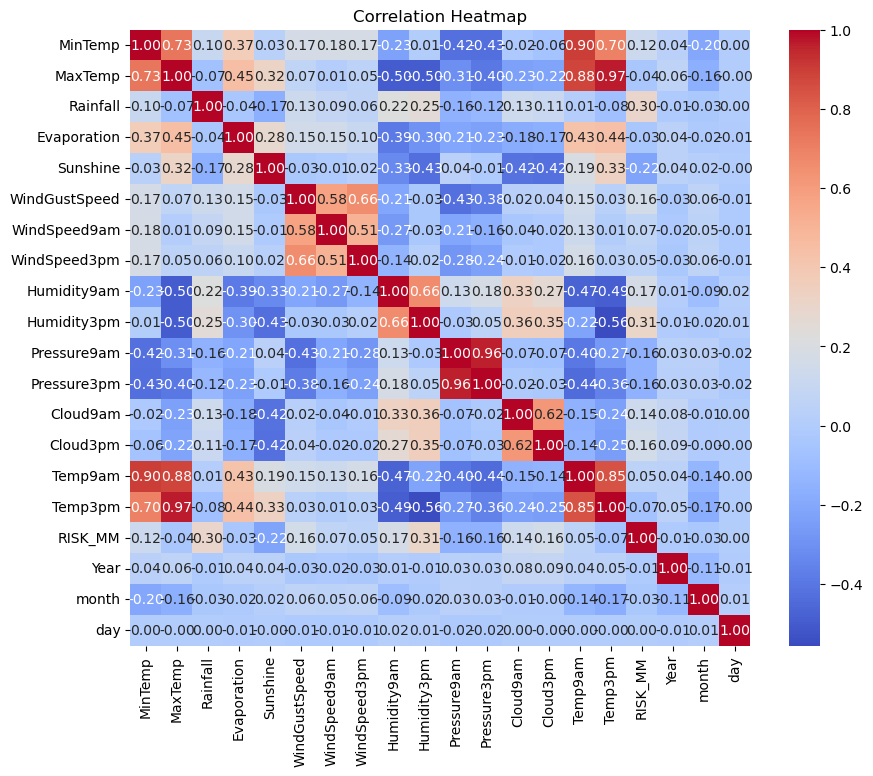

In [125]:
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [30]:
dic={'Yes':1,'No':0}
df['RainToday']=df['RainToday'].map(dic)
df['RainTomorrow']=df['RainTomorrow'].map(dic)

In [127]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Year,month,day
count,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,...,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000,142193.000000
mean,12.186400,23.226784,2.326738,5.183213,8.042236,39.920123,13.992489,18.644279,68.858235,51.495742,...,5.404274,5.505707,16.985681,21.675977,0.221213,2.360682,0.224181,2012.758926,6.402544,15.715084
std,6.388924,7.109554,8.426426,3.185401,2.769638,13.140632,8.851614,8.721688,18.932512,20.532227,...,2.594776,2.434727,6.472206,6.871243,0.415065,8.477969,0.417043,2.541256,3.426506,8.798150
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-7.200000,-5.400000,0.000000,0.000000,0.000000,2007.000000,1.000000,1.000000
25%,7.600000,17.900000,0.000000,4.000000,8.200000,31.000000,7.000000,13.000000,57.000000,37.000000,...,3.000000,4.000000,12.300000,16.700000,0.000000,0.000000,0.000000,2011.000000,3.000000,8.000000
50%,12.000000,22.700000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,...,7.000000,7.000000,16.700000,21.100000,0.000000,0.000000,0.000000,2013.000000,6.000000,16.000000
75%,16.800000,28.200000,0.600000,5.400000,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,...,7.000000,7.000000,21.500000,26.300000,0.000000,0.800000,0.000000,2015.000000,9.000000,23.000000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,...,9.000000,9.000000,40.200000,46.700000,1.000000,371.000000,1.000000,2017.000000,12.000000,31.000000


In [128]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RISK_MM', 'RainTomorrow', 'Year', 'month',
       'day'],
      dtype='object')

In [129]:
wind_frequency = df.groupby(['WindGustDir', 'WindGustSpeed']).size().reset_index(name='Count')
wind_direction_order = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
def wind_direction_plot(df, title):
    fig = px.bar_polar(df, r="Count", theta="WindGustDir",
                       color="WindGustSpeed", template="plotly_dark",
                       color_discrete_sequence=px.colors.sequential.Plasma[-2::-1],category_orders={"WindGustDir": wind_direction_order})
    fig.update_layout(title_text=title)
    fig.show()

wind_direction_plot(wind_frequency, "Wind Direction and Speed")

In [130]:
wind_frequency = df.groupby(['WindDir9am', 'WindSpeed9am']).size().reset_index(name='Count')
wind_direction_order = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
def wind_direction_plot(df, title):
    fig = px.bar_polar(df, r="Count", theta="WindDir9am",
                       color="WindSpeed9am", template="plotly_dark",
                       color_discrete_sequence=px.colors.sequential.Plasma[-2::-1],category_orders={"WindDir9am": wind_direction_order})
    fig.update_layout(title_text=title)
    fig.show()

wind_direction_plot(wind_frequency, "Wind Direction and Speed")

In [131]:
wind_frequency = df.groupby(['WindDir3pm', 'WindSpeed3pm']).size().reset_index(name='Count')
wind_direction_order = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
def wind_direction_plot(df, title):
    fig = px.bar_polar(df, r="Count", theta="WindDir3pm",
                       color="WindSpeed3pm", template="plotly_dark",
                       color_discrete_sequence=px.colors.sequential.Plasma[-2::-1],category_orders={"WindDir3pm": wind_direction_order})
    fig.update_layout(title_text=title)
    fig.show()

wind_direction_plot(wind_frequency, "Wind Direction and Speed")

In [132]:
Detect_outliers=detect_outliers(df[numerical_data],0,numerical_data)

In [135]:
len(Detect_outliers)

94657

## Split data

In [31]:
X=df.drop('RainTomorrow',axis=1)
Y=df['RainTomorrow']
#X_train,Y_train,X_test,Y_test=train_test_split(X,Y)


### Scaling

In [32]:
# Apply LabelEncoder to categorical columns before splitting the data
categorical_cols = X.select_dtypes(exclude='number').columns
label_encoder = LabelEncoder()
X[categorical_cols] = X[categorical_cols].apply(lambda col: label_encoder.fit_transform(col))

# Define lists of categorical and numerical columns
numerical_cols = X.select_dtypes(include='number').columns


In [139]:

results_list = []

# Define scalers and models as tuples with names and instantiated objects
Scalers = [
    ('standardScaler', StandardScaler()),
    ('minMaxScaler', MinMaxScaler()),
    ('robustScaler', RobustScaler())
]

Models = [
    ('LR', LogisticRegression()),
    ('DTree', DecisionTreeClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('Knn', KNeighborsClassifier()),
    ('Rforest', RandomForestClassifier()),
    ('SVC', SVC()),
    ('GNB', GaussianNB()),
    ('XgB', XGBClassifier())
]

for model_name, model in Models:
    print(f'For {model_name}')
    for scaler_name, scaler in Scalers:
       # print(f'Using {scaler_name} Scaler')
        
        # Separate ColumnTransformers for categorical and numerical columns
        preprocessor = ColumnTransformer(
            transformers=[
                ('num', scaler, numerical_cols),
                ('cat', 'passthrough', categorical_cols)
            ]
        )
        
        steps = [
            ('preprocessor', preprocessor),
            (model_name, model)
        ]
        # Pipeline
        pipeline = Pipeline(steps=steps)
        # Cross-validation
        cv_results = cross_validate(pipeline, X, Y, scoring='accuracy', cv=5, return_train_score=True)
        result = {
            'Model': model_name,
            'Scaler': scaler_name,
            'Test Accuracy': np.mean(cv_results['test_score']),
            'Train Accuracy': np.mean(cv_results['train_score'])
        }
        
        results_list.append(result)

# Convert the list of dictionaries to a DataFrame
results_df = pd.DataFrame(results_list)

# Apply background gradient to the 'Test Accuracy' and 'Train Accuracy' columns
df_style = results_df.style.background_gradient(cmap="Blues", subset=['Test Accuracy', 'Train Accuracy'])
print(df_style)


For LR
For DTree
For AdaBoost
For Knn
For Rforest
For SVC
For GNB
For XgB


In [34]:
df_result = jb.load('results_df.pkl')


In [35]:
#  background color
sstyle_df=df_result.style
sstyle_df.set_properties(**{
    "background-color": "#008080",
    "color": "white",
    "border": "1.5px solid black"
})

# table headers (th)
sstyle_df.set_table_styles([
  {"selector": "th", "props": [("color", 'white'), ("background-color", "black")]}
])

,Model,Scaler,Test Accuracy,Train Accuracy
0,LR,standardScaler,0.997335,0.997711
1,LR,minMaxScaler,0.839662,0.843683
2,LR,robustScaler,0.999958,0.999968
3,DTree,standardScaler,1.000000,1.000000
4,DTree,minMaxScaler,1.000000,1.000000
5,DTree,robustScaler,1.000000,1.000000
6,AdaBoost,standardScaler,1.000000,1.000000
7,AdaBoost,minMaxScaler,1.000000,1.000000
8,AdaBoost,robustScaler,1.000000,1.000000
9,Knn,standardScaler,0.811580,0.890490


# preparing Data for decision tree

In [36]:
#Standard Scaler
scaler=StandardScaler()
X[X.select_dtypes(include=np.number).columns]=scaler.fit_transform(X[X.select_dtypes(include=np.number).columns])

In [37]:
selector = SequentialFeatureSelector(estimator=DecisionTreeClassifier(), n_features_to_select=10, direction='forward')

In [38]:
## Fitting and tranfrom to see the best selected 
selector_result = pd.DataFrame(selector.fit_transform(X, Y), columns= selector.get_feature_names_out())
selector_result

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,RISK_MM
0,-1.527004,0.189954,-0.045964,-0.204920,-0.120303,0.16528,1.052556,0.310479,1.328933,-0.278450
1,-1.527004,-0.749174,0.263480,-0.276125,-0.120303,0.16528,1.265582,0.310479,-0.221571,-0.278450
2,-1.527004,0.111694,0.347873,-0.276125,-0.120303,0.16528,1.478609,0.462679,1.328933,-0.278450
3,-1.527004,-0.467436,0.671383,-0.276125,-0.120303,0.16528,-0.864683,-1.211523,0.442931,-0.160497
4,-1.527004,0.831692,1.276205,-0.157450,-0.120303,0.16528,1.052556,0.082179,-1.329073,-0.254859
...,...,...,...,...,...,...,...,...,...,...
142188,1.212249,-1.359608,-0.200686,-0.276125,-0.120303,0.16528,-1.716789,-0.678822,-1.107573,-0.278450
142189,1.212249,-1.469173,0.024364,-0.276125,-0.120303,0.16528,-1.716789,-0.678822,0.442931,-0.278450
142190,1.212249,-1.343956,0.291611,-0.276125,-0.120303,0.16528,-0.438630,-1.363723,0.442931,-0.278450
142191,1.212249,-1.062217,0.516661,-0.276125,-0.120303,0.16528,-1.077710,-0.222222,0.442931,-0.278450


In [39]:
selector_result.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'RISK_MM'],
      dtype='object')

# Cross_validatation

In [40]:
model = DecisionTreeClassifier()

cv_results = cross_validate(model, selector_result, Y, scoring='accuracy', cv=5, return_train_score=True)  # X and y are your input data and targets

# Access the results
print("test :", cv_results['test_score'].mean())
print("train:", cv_results['train_score'].mean())

test : 1.0
train: 1.0


## HyperParameter Tuning

In [41]:
# Define your parameter grid for GridSearchCV
param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}


In [42]:
#create decisionTree model
model=DecisionTreeClassifier()
grid_search=GridSearchCV(estimator=model,param_grid=param_grid,scoring='accuracy',cv=5, return_train_score=True)

In [43]:
#fit the GridSearch in data
grid_search.fit(selector_result,Y)


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 5, 10, 15],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']},
             return_train_score=True, scoring='accuracy')

In [44]:
best_estimator=grid_search.best_estimator_

In [45]:
# Get the mean test score and mean train score for the best estimator
mean_test_score = grid_search.cv_results_['mean_test_score'][grid_search.best_index_]
mean_train_score = grid_search.cv_results_['mean_train_score'][grid_search.best_index_]
print('Mean_test_score',mean_test_score)
print('Mean_train_score',mean_train_score)

Mean_test_score 1.0
Mean_train_score 1.0


##### Testing the best estimator 

In [46]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=.15,random_state=42)

In [47]:
best_estimator = grid_search.best_estimator_
best_estimator.fit(X_train, Y_train)


DecisionTreeClassifier()

In [48]:
Y_test_pred=best_estimator.predict(X_test)

Y_train_pred=best_estimator.predict(X_train)

In [49]:
# Calculate and print the accuracy scores
train_accuracy = accuracy_score(Y_train, Y_train_pred)
test_accuracy = accuracy_score(Y_test, Y_test_pred)

print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")

Train Accuracy: 1.00
Test Accuracy: 1.00


In [50]:
cm=confusion_matrix(Y_test,Y_test_pred)

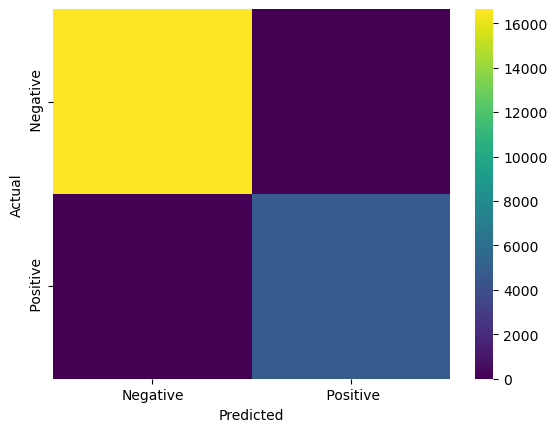

In [51]:
sns.heatmap(cm,cmap='viridis',xticklabels=['Negative', ' Positive'], yticklabels=[' Negative', ' Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [52]:
cm=classification_report(Y_test,Y_test_pred)

In [53]:
cm

'              precision    recall  f1-score   support\n\n           0       1.00      1.00      1.00     16635\n           1       1.00      1.00      1.00      4694\n\n    accuracy                           1.00     21329\n   macro avg       1.00      1.00      1.00     21329\nweighted avg       1.00      1.00      1.00     21329\n'

In [54]:
best_estimator.fit(selector_result, Y)

DecisionTreeClassifier()

##### Saving important objects for deployment

In [55]:
jb.dump(df[selector_result.columns],'selector_result.pkl')
jb.dump(label_encoder,'Encoder.pkl')
jb.dump(scaler,'Scaler.pkl')
jb.dump(best_estimator,'Model.pkl')

['Model.pkl']

In [56]:
df[selector_result.columns]

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,RISK_MM
0,Albury,13.4,22.9,0.6,4.8,8.5,W,44.0,W,0.0
1,Albury,7.4,25.1,0.0,4.8,8.5,WNW,44.0,NNW,0.0
2,Albury,12.9,25.7,0.0,4.8,8.5,WSW,46.0,W,0.0
3,Albury,9.2,28.0,0.0,4.8,8.5,NE,24.0,SE,1.0
4,Albury,17.5,32.3,1.0,4.8,8.5,W,41.0,ENE,0.2
...,...,...,...,...,...,...,...,...,...,...
142188,Uluru,3.5,21.8,0.0,4.8,8.5,E,31.0,ESE,0.0
142189,Uluru,2.8,23.4,0.0,4.8,8.5,E,31.0,SE,0.0
142190,Uluru,3.6,25.3,0.0,4.8,8.5,NNW,22.0,SE,0.0
142191,Uluru,5.4,26.9,0.0,4.8,8.5,N,37.0,SE,0.0


In [57]:
jb.load('Model.pkl')

DecisionTreeClassifier()